# Modelo de Denoising Utilizando a Arquitetura U-Net

Denoising de Imagens de Aeronaves com U-Net

Neste experimento, será desenvolvido um modelo de remoção de ruído (denoising) utilizando a arquitetura U-Net, amplamente empregada em tarefas de segmentação e restauração de imagens.
O objetivo principal é reduzir ruídos gaussiano em imagens de aeronaves, preservando os detalhes estruturais e de contorno dos objetos de interesse.

O dataset base é o mesmo utilizado na tarefa de classificação de aeronaves, garantindo consistência entre os diferentes módulos do pipeline proposto (detecção → classificação → denoising).
Para tornar o processo computacionalmente mais eficiente, todas as imagens serão convertidas para escala de cinza, reduzindo a dimensionalidade da entrada sem comprometer a essência visual necessária à tarefa de reconstrução.

O workflow deste notebook será dividido nas seguintes etapas:

- Preparação dos dados

- Carregamento das imagens originais.

- Conversão para escala de cinza.

- Adição de ruído gaussiano controlado.

- Divisão em conjuntos de treino e validação.

- Definição da arquitetura U-Net

- Implementação da rede U-Net com camadas de codificação e decodificação simétricas.

- Utilização de skip connections para preservar detalhes espaciais.

- Treinamento do modelo

- Otimização com função de perda baseada em Mean Squared Error (MSE).

- Monitoramento do desempenho em imagens com ruído.

- Avaliação e visualização dos resultados

- Comparação entre imagens ruidosas, originais e reconstruídas.

- Métricas quantitativas (PSNR, SSIM) e análise qualitativa.

# Diretório de trabalho

In [ ]:
from google.colab import drive
import os

# Monta o drive no Google Colab
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


# Importar Pacotes e Funções

In [ ]:
# Standard
import matplotlib.pyplot as plt
import numpy as np
import cv2
import pandas as pd
from PIL import Image
import os


import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras import backend as keras
import tensorflow.keras.backend as K
from tensorflow import argmax
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import load_model

## Funções Criadas

### Função para adicionar ruído as imagens

In [ ]:
def add_gaussian_noise(image, mean=0.0, std=0.1):
    noise = np.random.normal(mean, std, image.shape)
    noise = noise.astype(image.dtype)
    noisy_image = image + noise
    noisy_image = np.clip(noisy_image, 0.0, 1.0)  # Assegure que a imagem está no intervalo [0, 1]
    return noisy_image

In [ ]:
def add_noise_to_images(images, mean=0.0, std=0.1):
    noisy_images = []
    for image in images:
        noisy_image = add_gaussian_noise(image, mean, std)
        noisy_images.append(noisy_image)
    return np.array(noisy_images)

### Função de Perda

In [ ]:
from tensorflow.keras.losses import MeanSquaredError

loss = MeanSquaredError()

In [ ]:
# from tensorflow.keras.losses import MeanAbsoluteError

# loss = MeanAbsoluteError()

### Métricas de Avaliação

In [ ]:
def psnr(y_true, y_pred):
    return tf.image.psnr(y_true, y_pred, max_val=1.0)

In [ ]:
def ssim(y_true, y_pred):
    return tf.image.ssim(y_true, y_pred, max_val=1.0)

### Arquitetura U-Net

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, Activation, BatchNormalization, MaxPooling2D, UpSampling2D, concatenate
from tensorflow.keras.models import Model

def conv_block(x, filters, kernel_size=3, padding="same", use_batch_norm=False):
    x = Conv2D(filters=filters, kernel_size=kernel_size, padding=padding,
               kernel_initializer='he_normal')(x)
    x = Activation("relu")(x)
    if use_batch_norm:
        x = BatchNormalization()(x)
    return x

def UNet_denoising(input_size, depth, base_filters, use_batch_norm):

    # Input layer
    inputs = Input(input_size)
    x = inputs

    # Encoding
    down_layers = []
    filters = base_filters
    for _ in range(depth):
        x = conv_block(x, filters, use_batch_norm=use_batch_norm)
        x = conv_block(x, filters, use_batch_norm=use_batch_norm)
        down_layers.append(x)
        x = MaxPooling2D(pool_size=2)(x)
        filters *= 2

    # Bottom
    x = conv_block(x, filters, use_batch_norm=use_batch_norm)
    x = conv_block(x, filters, use_batch_norm=use_batch_norm)

    # Decoding
    for layer in reversed(down_layers):
        filters //= 2
        x = UpSampling2D(size=(2, 2))(x)
        x = concatenate([x, layer])
        x = conv_block(x, filters, use_batch_norm=use_batch_norm)
        x = conv_block(x, filters, use_batch_norm=use_batch_norm)

    # Output layer
    x = Conv2D(filters=input_size[-1], kernel_size=1)(x)
    if use_batch_norm:
        x = BatchNormalization()(x)
    outputs = Activation("sigmoid")(x)

    model = Model(inputs, outputs)
    return model


- função de plot

In [ ]:
import matplotlib.pyplot as plt

def mostrar_imagens(images, noise_images, predicted, n_plots, titulo1='Imagem Original', titulo2='Imagem com Ruído', titulo3='Imagem Reconstruida'):
    if n_plots > len(images):
        n_plots = len(images)

    for i in range(n_plots):
        # Criando uma figura para plotar
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))  # 1 linha, 3 colunas de imagens

        # Mostrando a imagem original
        axs[0].imshow(images[i], cmap='gray')
        axs[0].set_title(f'{titulo1} {i}')
        axs[0].axis('off')

        # Mostrando a máscara verdadeira
        axs[1].imshow(noise_images[i], cmap='gray')
        axs[1].set_title(titulo2)
        axs[1].axis('off')

        # Mostrando a máscara modificada
        axs[2].imshow(predicted[i], cmap='gray')
        axs[2].set_title(titulo3)
        axs[2].axis('off')

        plt.show()

# Exemplo de uso da função
# mostrar_imagens(images, masks_original, mask_modificada, n_plots, titulo1='Imagem Original', titulo2='Máscara Verdadeira', titulo3='Máscara Modificada')


In [ ]:
import matplotlib.pyplot as plt

def mostrar_imagens(images, noise_images, predicted, n_plots,
                    titulo1='Imagem Original', titulo2='Imagem com Ruído', titulo3='Imagem Reconstruída'):
    """
    Exibe n_plots colunas, cada uma contendo:
    - Linha 1: imagem original
    - Linha 2: imagem com ruído
    - Linha 3: imagem reconstruída (predita)
    """
    if n_plots > len(images):
        n_plots = len(images)

    fig, axs = plt.subplots(3, n_plots, figsize=(4 * n_plots, 9))
    # fig.suptitle('Amostras de Denoising — Original, Ruído e Reconstrução', fontsize=16)

    for i in range(n_plots):
        # Primeira linha — imagens originais
        axs[0, i].imshow(images[i], cmap='gray')
        axs[0, i].set_title(f'{titulo1} {i+1}')
        axs[0, i].axis('off')

        # Segunda linha — imagens com ruído
        axs[1, i].imshow(noise_images[i], cmap='gray')
        axs[1, i].set_title(f'{titulo2} {i+1}')
        axs[1, i].axis('off')

        # Terceira linha — imagens reconstruídas
        axs[2, i].imshow(predicted[i], cmap='gray')
        axs[2, i].set_title(f'{titulo3} {i+1}')
        axs[2, i].axis('off')

    plt.tight_layout()
    plt.show()

# Exemplo de uso:
# mostrar_imagens(images, noisy_images, predicted_images, n_plots=4)


In [ ]:
def mostrar_imagens2(y_images, x_images, n_plots, titulo1='Imagem Original', titulo2='Imagem com Ruído'):
    if n_plots > len(y_images):
        n_plots = len(y_images)

    for i in range(n_plots):
        # Criando uma figura para plotar
        fig, axs = plt.subplots(1, 2, figsize=(15, 5))  # 1 linha, 2 colunas de imagens

        # Mostrando a imagem original
        axs[0].imshow(y_images[i], cmap='gray')
        axs[0].set_title(f'{titulo1} {i}')
        axs[0].axis('off')

        # Mostrando a máscara verdadeira
        axs[1].imshow(x_images[i], cmap='gray')
        axs[1].set_title(titulo2)
        axs[1].axis('off')

        plt.show()

# Exemplo de uso da função
# mostrar_imagens2(images, masks_original, n_plots, titulo1='Imagem Original', titulo2='Máscara Verdadeira')

In [ ]:
import matplotlib.pyplot as plt

def mostrar_imagens2(y_images, x_images, n_plots, titulo1='Imagem Original', titulo2='Imagem Com Ruído'):
    """
    Exibe n_plots imagens originais na primeira linha e suas respectivas máscaras na segunda linha.
    """
    if n_plots > len(y_images):
        n_plots = len(y_images)

    fig, axs = plt.subplots(2, n_plots, figsize=(4 * n_plots, 8))
    # fig.suptitle('Amostras de Imagens e Máscaras', fontsize=16)

    for i in range(n_plots):
        # Primeira linha: imagens originais
        axs[0, i].imshow(y_images[i], cmap='gray')
        axs[0, i].set_title(f'{titulo1} {i+1}')
        axs[0, i].axis('off')

        # Segunda linha: máscaras correspondentes
        axs[1, i].imshow(x_images[i], cmap='gray')
        axs[1, i].set_title(f'{titulo2} {i+1}')
        axs[1, i].axis('off')

    plt.tight_layout()
    plt.show()

# Exemplo de uso:
# mostrar_imagens2(images, masks, n_plots=4, titulo1='Imagem Original', titulo2='Máscara Verdadeira')


# Preparando os Dados


## Carregando as imagens para array numpy

In [ ]:
import zipfile

# Caminho do arquivo no Drive
zip_path = "/content/drive/MyDrive/AEROESPACIAIS/Aircraft_Dataset.zip"
output_dir = "/content/"

# Descompacta
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(output_dir)

print(f"Dataset descompactado em: {output_dir}")

Dataset descompactado em: /content/


In [ ]:
import pathlib

data_dir = "/content/Aircraft_Dataset"
data_dir = pathlib.Path(data_dir)

image_count = len(list(data_dir.glob('*/*.jpeg')))
print(image_count)

4369


In [ ]:
images_gray = []
target_size = (256, 256)  # Define the target size

for image_path in data_dir.glob('*/*.jpeg'):
    image = cv2.imread(str(image_path))
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Resize the image
    image_gray_resized = cv2.resize(image_gray, target_size, interpolation=cv2.INTER_AREA)
    images_gray.append(image_gray_resized)

images_gray = np.array(images_gray, dtype=np.float32)  # importante float32 para o modelo

In [ ]:
images_gray.shape, images_gray.dtype

((4369, 256, 256), dtype('float32'))

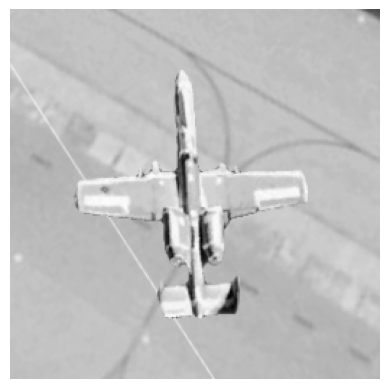

In [ ]:
plt.imshow(images_gray[0], cmap='gray')
plt.axis('off');

## Adicionando uma dimensão extra

In [ ]:
images_gray = np.expand_dims(images_gray, axis = -1) # (256, 256) -> (256, 256, 1)

In [ ]:
images_gray.shape, images_gray.dtype

((4369, 256, 256, 1), dtype('float32'))

## Normalizando as imagens





In [ ]:
max(np.unique(images_gray[0]))

np.float32(253.0)

In [ ]:
images_gray= images_gray/255.0

In [ ]:
max(np.unique(images_gray[0]))

np.float32(0.99215686)

## Acrescentando Ruído as Imagens

In [ ]:
# Adicione ruído
noisy_images = add_noise_to_images(images_gray, mean=0, std=0.04)

In [ ]:
noisy_images.shape, noisy_images.dtype

((4369, 256, 256, 1), dtype('float32'))

## Separando os conjuntos

In [ ]:
from sklearn.model_selection import train_test_split
import numpy as np

# 1️⃣ Divisão em treino (70%), validação (15%) e teste (15%)

# Primeiro: treino e temp (val+teste)
noisy_train, noisy_temp, clean_train, clean_temp = train_test_split(
    noisy_images, images_gray,
    test_size=0.3,          # 30% vão para validação + teste
    random_state=42,
    shuffle=True
)

# Depois: dividir o temp em validação e teste (metade de cada)
noisy_val, noisy_test, clean_val, clean_test = train_test_split(
    noisy_temp, clean_temp,
    test_size=0.5,          # 15% teste + 15% validação
    random_state=42,
    shuffle=True
)

# 2️⃣ Mostrar os tamanhos resultantes
print("Treino:", noisy_train.shape, clean_train.shape)
print("Validação:", noisy_val.shape, clean_val.shape)
print("Teste:", noisy_test.shape, clean_test.shape)


Treino: (3058, 256, 256, 1) (3058, 256, 256, 1)
Validação: (655, 256, 256, 1) (655, 256, 256, 1)
Teste: (656, 256, 256, 1) (656, 256, 256, 1)


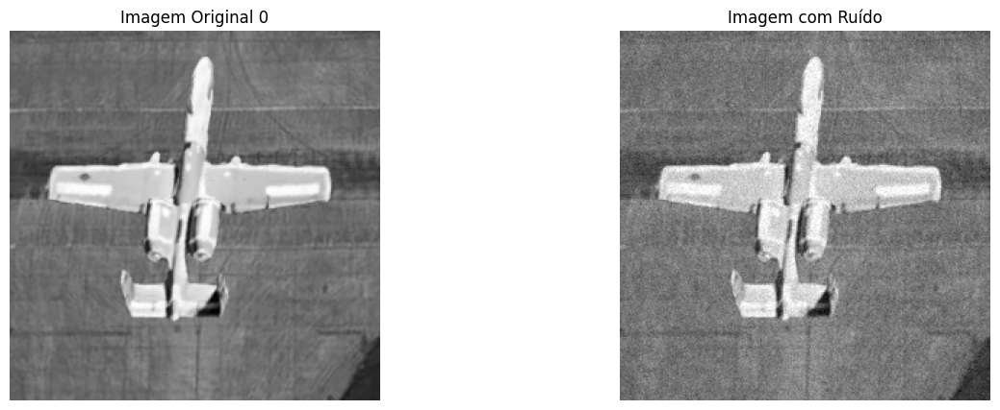

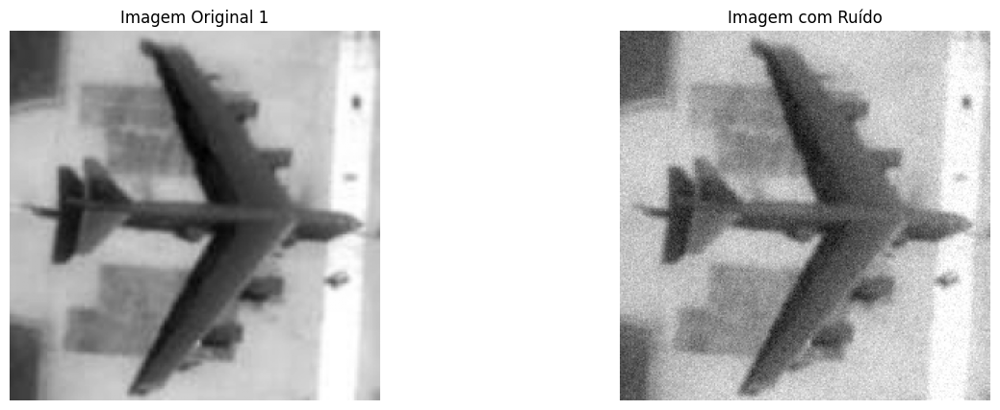

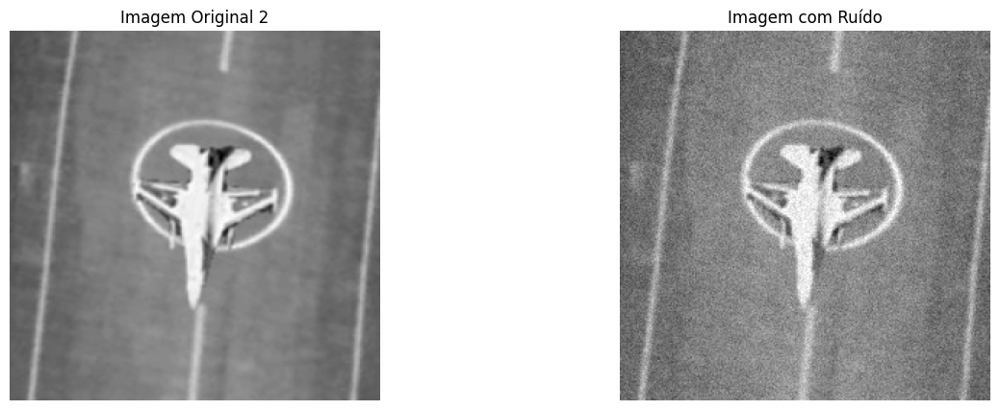

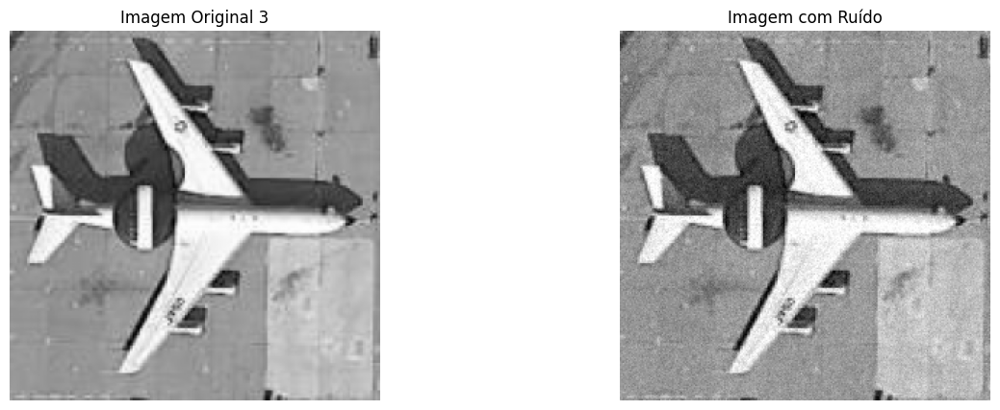

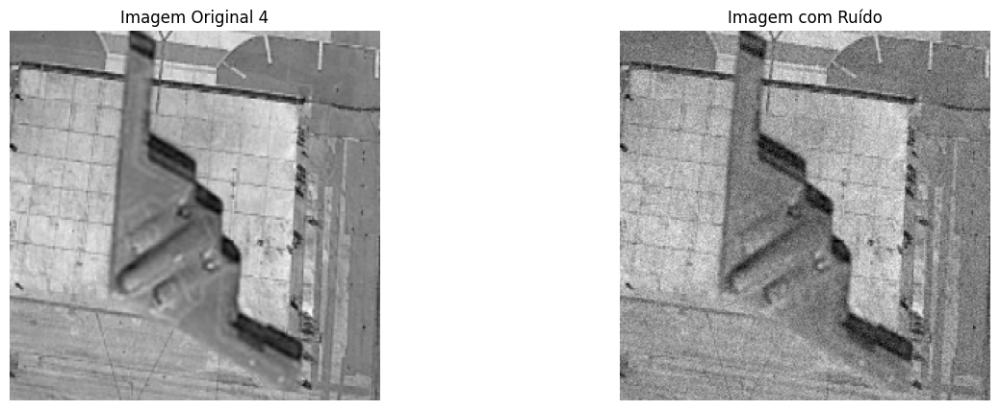

In [ ]:
mostrar_imagens2(clean_train, noisy_train, n_plots=5)

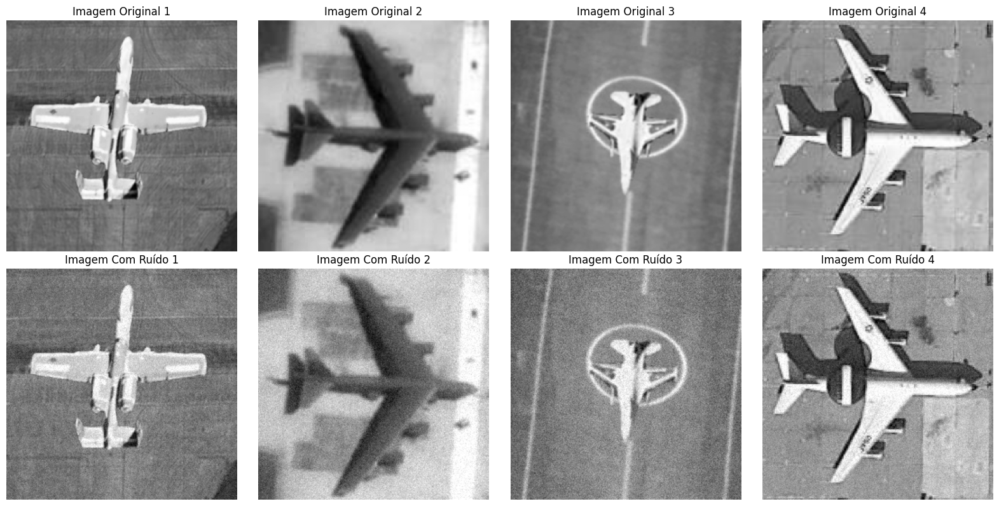

In [ ]:
mostrar_imagens2(clean_train, noisy_train, n_plots=4)

#Treinamento

In [ ]:
import tensorflow as tf
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam

# Limpar sessão anterior para liberar GPU
tf.keras.backend.clear_session()

# Parâmetros principais
input_size = (256, 256, 1)  # Imagens em escala de cinza
depth = 4                   # Profundidade da U-Net
filters = 32                # Número de filtros iniciais
batch_norm = True

# Criação do modelo
unet = UNet_denoising(input_size, depth, filters, batch_norm)

In [ ]:
# Callbacks
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-6,
    verbose=1
)

early_stop = EarlyStopping(
    monitor='val_loss',
    patience=15,
    restore_best_weights=True,
    verbose=1
)

checkpoint = ModelCheckpoint(
    filepath='/content/unet_best_model.keras',
    monitor='val_loss',
    save_best_only=True,
    verbose=1
)

callbacks = [reduce_lr, early_stop, checkpoint]

In [ ]:
unet.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        320 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256, 256,  │          0 │ conv2d[0][0]      │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │        128 │ activation[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      9,248 │ batch_normalizat… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256, 256,  │          0 │ conv2d_1[0][0]    │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │        128 │ activation_1[0][… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 128, 128,  │          0 │ conv2d_2[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ activation_2[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 128, 128,  │          0 │ conv2d_3[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ activation_3[0][… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 64, 64,    │          0 │ conv2d_4[0][0]  

 Total params: 7,857,861 (29.98 MB)

 Trainable params: 7,851,971 (29.95 MB)

 Non-trainable params: 5,890 (23.01 KB)

In [ ]:
# Compilação
unet.compile(
    optimizer=Adam(learning_rate=1e-3),
    loss=loss,             # sua função de perda (ex: MSE)
    metrics=[psnr, ssim]   # métricas personalizadas
)

In [ ]:
# Treinamento
history = unet.fit(
    x=noisy_train,
    y=clean_train,
    validation_data=(noisy_val, clean_val),
    epochs=200,
    batch_size=8,  # ajuste conforme a memória da GPU
    callbacks=callbacks,
    verbose=1
)

Epoch 1/200
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 226ms/step - loss: 0.0061 - psnr: 24.6940 - ssim: 0.7873
Epoch 1: val_loss improved from inf to 0.00219, saving model to /content/unet_best_model.keras
383/383 ━━━━━━━━━━━━━━━━━━━━ 149s 277ms/step - loss: 0.0061 - psnr: 24.6980 - ssim: 0.7875 - val_loss: 0.0022 - val_psnr: 27.1431 - val_ssim: 0.8704 - learning_rate: 0.0010
Epoch 2/200
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - loss: 0.0027 - psnr: 27.4020 - ssim: 0.8836
Epoch 2: val_loss improved from 0.00219 to 0.00074, saving model to /content/unet_best_model.keras
383/383 ━━━━━━━━━━━━━━━━━━━━ 70s 184ms/step - loss: 0.0027 - psnr: 27.4031 - ssim: 0.8837 - val_loss: 7.4354e-04 - val_psnr: 32.0294 - val_ssim: 0.8922 - learning_rate: 0.0010
Epoch 3/200
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step - loss: 0.0021 - psnr: 28.3825 - ssim: 0.8945
Epoch 3: val_loss improved from 0.00074 to 0.00049, saving model to /content/unet_best_model.keras
383/383 ━━━━━━━━━━━━━━━━━━━━ 72s 187ms/step - loss: 0.0

In [ ]:
# Salvar o modelo
model_path = '/content/drive/MyDrive/AEROESPACIAIS/DENOISING/modelo_unet_denoising_e200.h5'
unet.save(model_path)

## Gráficos

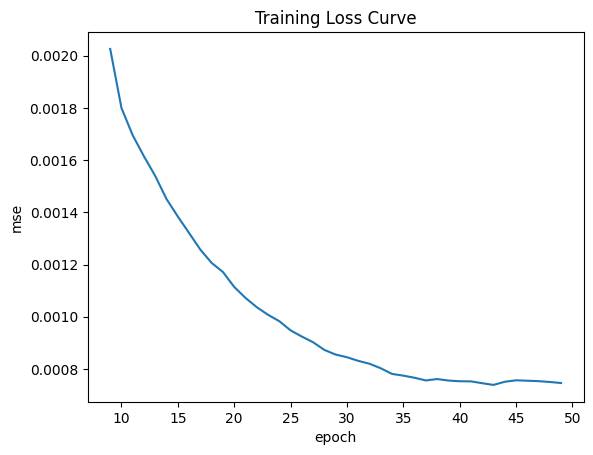

In [ ]:
loss = pd.Series(history.history['loss']).rolling(10).mean()

plt.plot( loss )
plt.ylabel("mse")
plt.xlabel("epoch")
plt.title("Training Loss Curve")
plt.show()

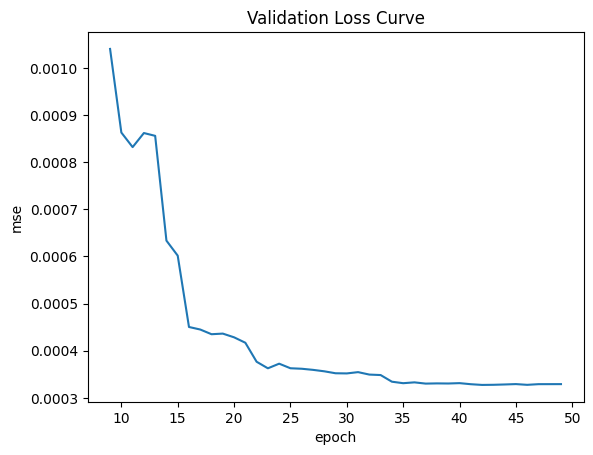

In [ ]:
val_loss = pd.Series(history.history['val_loss']).rolling(10).mean()

plt.plot(val_loss)
plt.ylabel("mse")
plt.xlabel("epoch")
plt.title("Validation Loss Curve")
#plt.yscale("log")
plt.show()

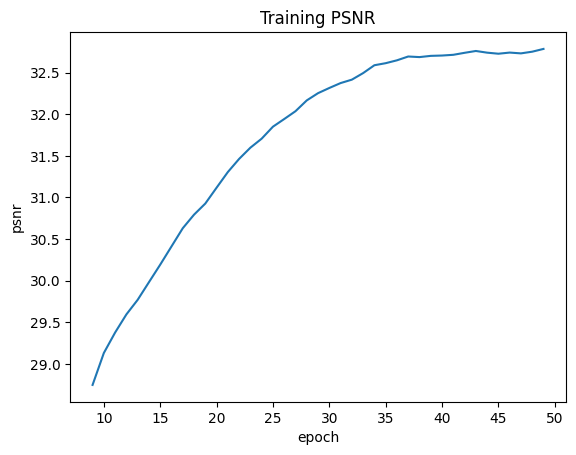

In [ ]:
loss = pd.Series(history.history['psnr']).rolling(10).mean()

plt.plot( loss )
plt.ylabel("psnr")
plt.xlabel("epoch")
plt.title("Training PSNR")
plt.show()

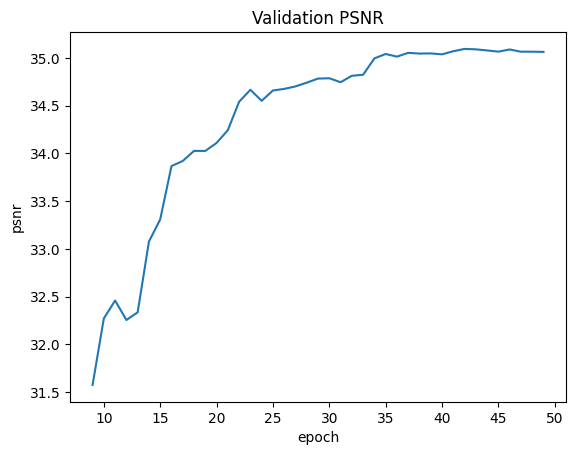

In [ ]:
val_loss = pd.Series(history.history['val_psnr']).rolling(10).mean()

plt.plot(val_loss)
plt.ylabel("psnr")
plt.xlabel("epoch")
plt.title("Validation PSNR")
#plt.yscale("log")
plt.show()

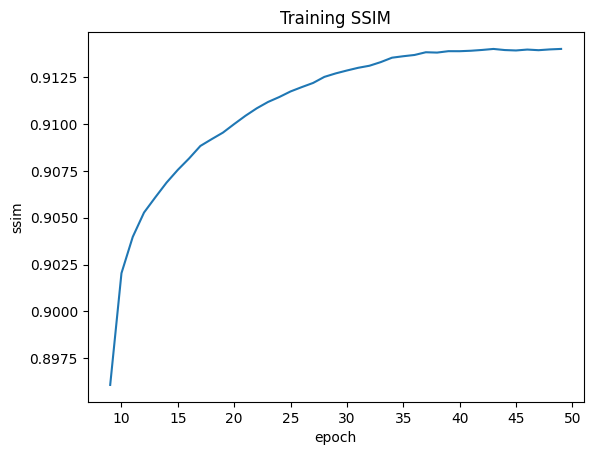

In [ ]:
loss = pd.Series(history.history['ssim']).rolling(10).mean()

plt.plot( loss )
plt.ylabel("ssim")
plt.xlabel("epoch")
plt.title("Training SSIM")
plt.show()

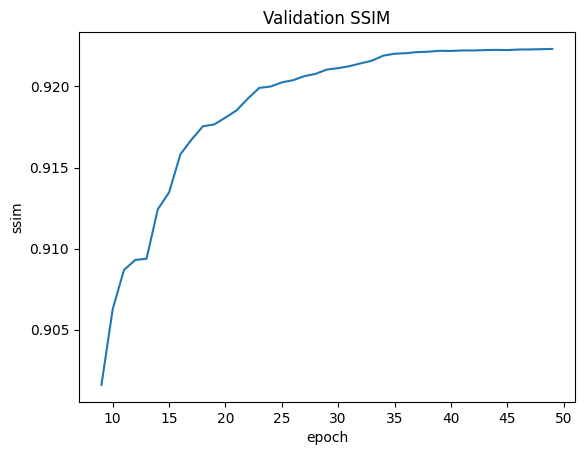

In [ ]:
val_loss = pd.Series(history.history['val_ssim']).rolling(10).mean()

plt.plot(val_loss)
plt.ylabel("ssim")
plt.xlabel("epoch")
plt.title("Validation SSIM")
#plt.yscale("log")
plt.show()

# Predições

In [ ]:
# Caminho para o modelo no Google Drive
caminho_modelo = '/content/drive/MyDrive/AEROESPACIAIS/DENOISING/modelo_unet_denoising_e200_best.keras'

# Carregar o modelo
custom_objects = {'psnr': psnr,
                  'ssim': ssim,
                  'loss': loss}
unet = load_model(caminho_modelo, custom_objects=custom_objects)

In [ ]:
metrics = unet.evaluate(noisy_test, clean_test, verbose=1)

for metric_name, metric_value in zip(unet.metrics_names, metrics):
    print(f"{metric_name}: {metric_value}")

21/21 ━━━━━━━━━━━━━━━━━━━━ 32s 668ms/step - loss: 3.0690e-04 - psnr: 35.3908 - ssim: 0.9219
loss: 0.0003072525723837316
compile_metrics: 35.40361022949219


In [ ]:
predicted_images = []
for i in range(len(noisy_test)):
    prediction = unet.predict(noisy_test[i:i+1,:,:,:], verbose=3)
    prediction = prediction.reshape([256, 256, 1])
    predicted_images.append(prediction)

In [ ]:
predicted_images = np.array(predicted_images)

In [ ]:
predicted_images.shape

(656, 256, 256, 1)

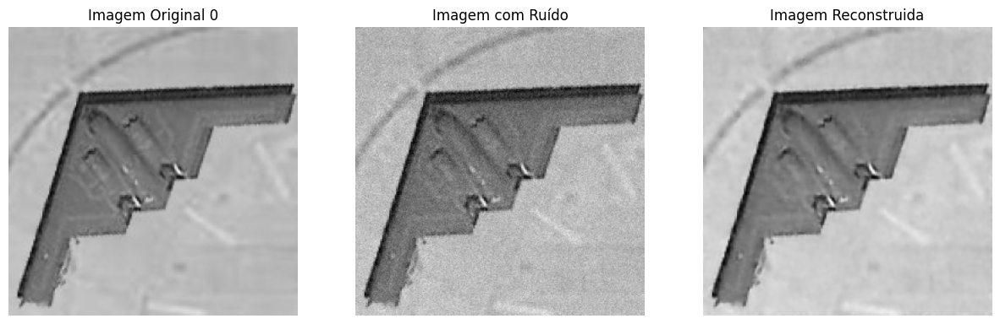

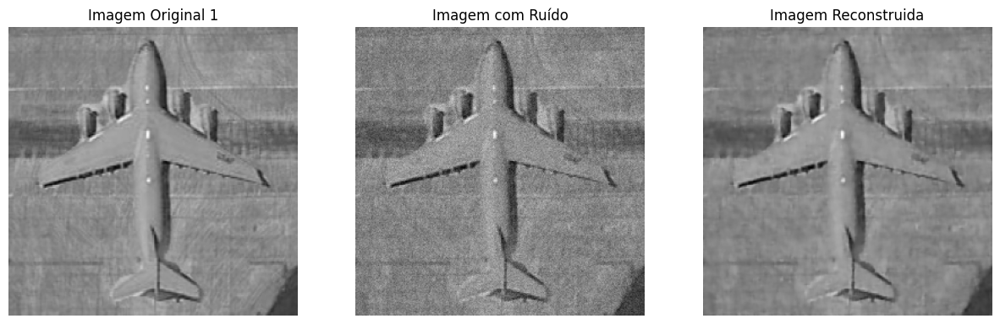

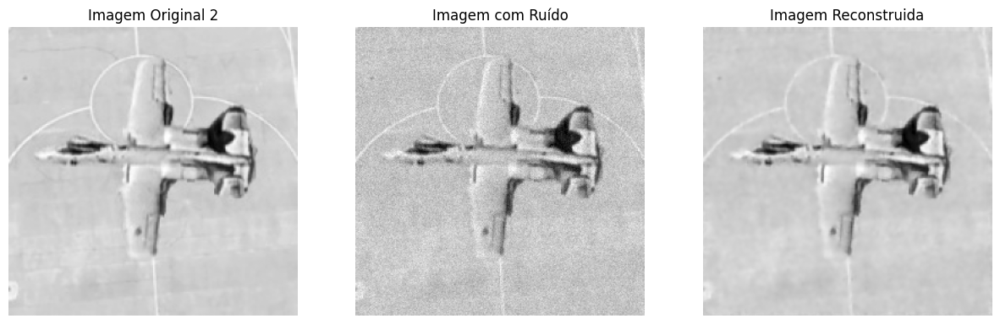

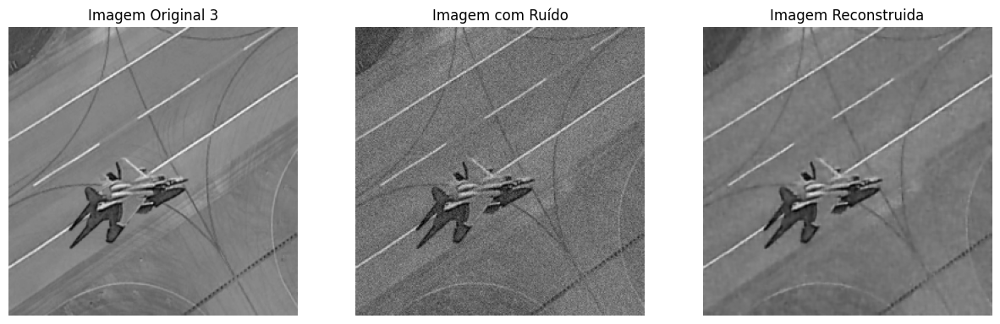

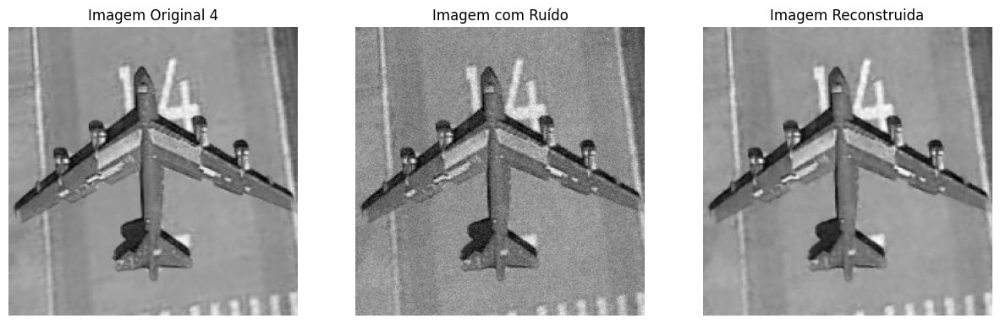

...

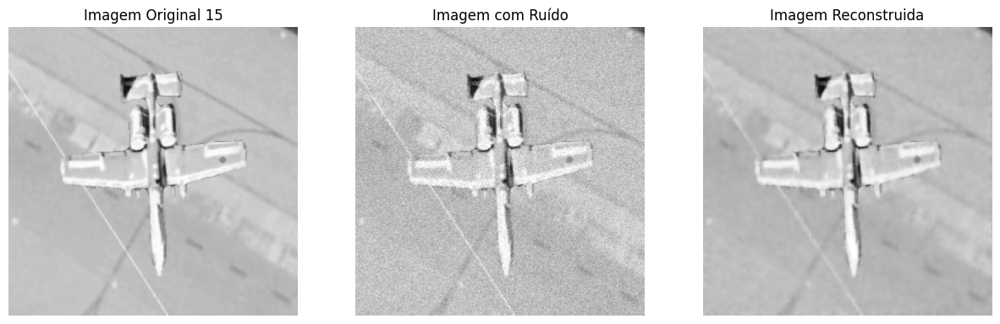

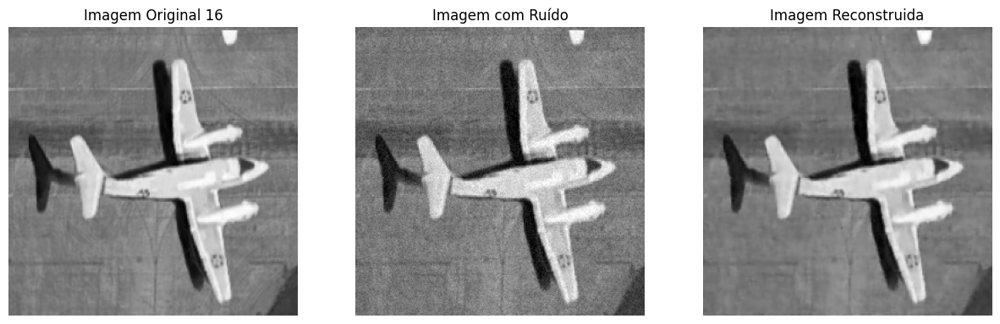

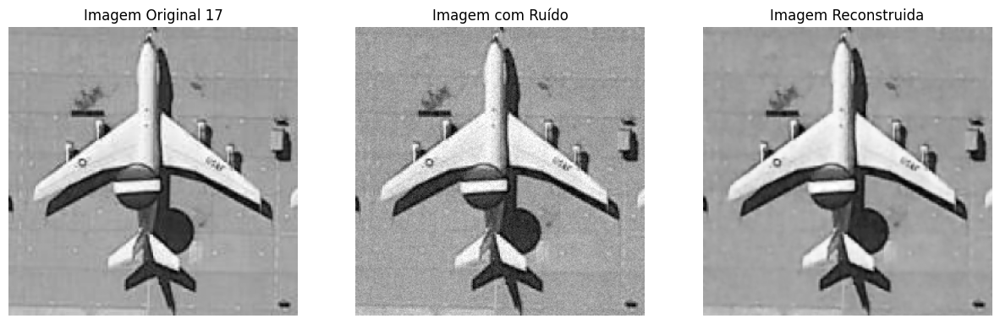

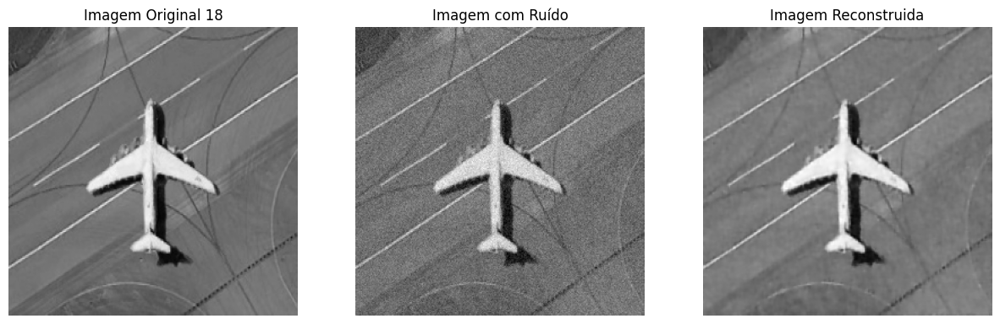

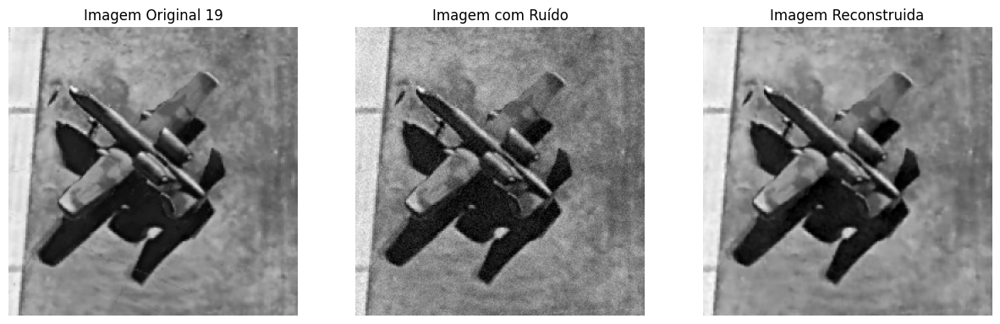

In [ ]:
mostrar_imagens(clean_test, noisy_test, predicted_images, n_plots=20)

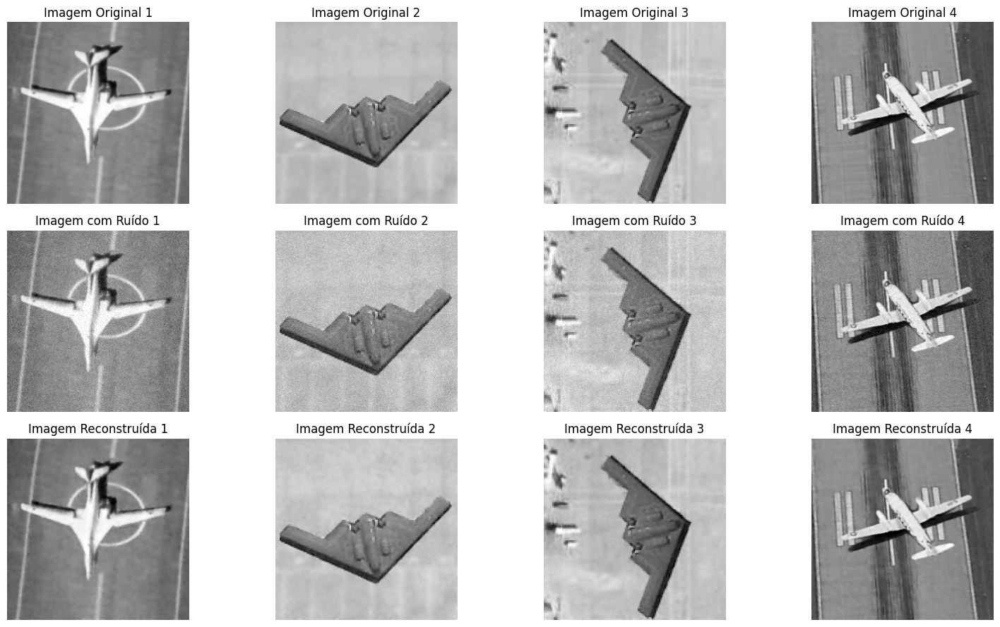

In [ ]:
mostrar_imagens(clean_test, noisy_test, predicted_images, n_plots=4)